# **Restoration and Segmentation of Retinal Blood Vessels Using CLAHE Enhancement and Morphological Thresholding**

**Mini Project - Digital Image Processing**

**Dataset:** DRIVE (Digital Retinal Images for Vessel Extraction)

## Step 0: Get the dataset into Colab

In [1]:
# OPTION A: Upload a zip file of your DRIVE dataset directly from your computer
from google.colab import files
uploaded = files.upload()  # select your DRIVE.zip file when prompted

import zipfile, os
for fname in uploaded.keys():
    if fname.endswith(".zip"):
        with zipfile.ZipFile(fname, 'r') as zip_ref:
            zip_ref.extractall(".")
        print(f"Extracted {fname}")

Saving DRIVE.zip to DRIVE.zip
Extracted DRIVE.zip


## Step 1: Install dependencies

In [12]:
!pip install opencv-python-headless numpy matplotlib pillow -q

## Step 2: Imports Libraries and configuration

In [13]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

#Configuration
DATASET_ROOT = "DRIVE"           # top-level folder after unzipping
SPLIT = "training"               # "training" has ground-truth masks; "test" usually doesn't
IMAGES_SUBDIR = "images"
MASKS_SUBDIR = "1st_manual"      # ground-truth vessel masks (only exists for "training")
FOV_SUBDIR = "mask"              # field-of-view mask (limits evaluation to the retina circle)

OUTPUT_FOLDER = "output"
NUM_IMAGES_TO_USE = 15           # how many images from the folder to process

os.makedirs(OUTPUT_FOLDER, exist_ok=True)

## Step 3: Helper functions for loading images and masks

In [14]:
def load_gif_as_mask(path):
    """DRIVE ground-truth and FOV masks are .gif files; OpenCV can't
    reliably read these, so we use PIL and convert to a binary mask."""
    if not os.path.exists(path):
        return None
    img = Image.open(path).convert("L")
    arr = np.array(img)
    _, binary = cv2.threshold(arr, 127, 255, cv2.THRESH_BINARY)
    return binary


def find_matching_file(folder, image_id, suffixes):
    """DRIVE filenames follow patterns like '21_training.tif',
    '21_manual1.gif', '21_training_mask.gif'. This tries a few
    common suffix patterns to find the matching file for a given
    numeric image_id."""
    for suffix in suffixes:
        candidates = glob.glob(os.path.join(folder, f"{image_id}{suffix}"))
        if candidates:
            return candidates[0]
    return None


## Step 4: Preprocessing + Restoration

In [15]:
def preprocess_and_restore(image):
    """
    Extract the green channel (vessels have the highest contrast there),
    denoise, and enhance contrast. This is the restoration component (CO4).
    """
    # Green channel extraction: retinal vessels appear darkest and most
    # distinguishable from background in the green channel, since both
    # red and blue channels tend to saturate or show low contrast.
    green = image[:, :, 1]

    # Restoration: median filter removes sensor/imaging noise while
    # preserving thin vessel edges better than Gaussian blur would.
    denoised = cv2.medianBlur(green, 3)

    # Contrast enhancement with CLAHE makes faint small vessels more
    # visible without over-amplifying noise in flat background regions.
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8, 8))
    enhanced = clahe.apply(denoised)

    return green, enhanced

## Step 5: Segmentation - Black-hat filtering + Otsu thresholding

In [16]:
def segment_vessels(enhanced_image, fov_mask=None):
    """
    Vessels are thin, dark, elongated structures on a brighter background.
    Black-hat morphological filtering highlights exactly these structures,
    after which Otsu's method picks a good global threshold to binarize them.
    """
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))
    blackhat = cv2.morphologyEx(enhanced_image, cv2.MORPH_BLACKHAT, kernel)

    _, vessels = cv2.threshold(blackhat, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Post-processing: remove tiny isolated noise specks.
    small_kernel = np.ones((2, 2), np.uint8)
    vessels = cv2.morphologyEx(vessels, cv2.MORPH_OPEN, small_kernel)

    # Restrict to the field-of-view (retina circle) if a mask is available,
    # since outside it is just black background that isn't part of the eye.
    if fov_mask is not None:
        vessels = cv2.bitwise_and(vessels, vessels, mask=fov_mask)

    return vessels

In [24]:
def segment_vessels_adaptive(enhanced_image, fov_mask=None):
    """
    Alternative segmentation method: adaptive thresholding instead of
    global Otsu. Adaptive thresholding computes a different threshold
    for each local neighborhood, which can help with retinal images
    since illumination often varies across the image (brighter near
    the optic disc, darker at the edges).
    """
    # Adaptive threshold directly on the enhanced (CLAHE) image.
    # Vessels are darker than surroundings, so THRESH_BINARY_INV picks
    # out the dark thin structures as foreground.
    vessels = cv2.adaptiveThreshold(
        enhanced_image, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        blockSize=15,   # size of the local neighborhood - try 11, 15, 21
        C=2             # constant subtracted from the local mean - try 1-5
    )

    # Post-processing: remove tiny isolated noise specks (same as before).
    small_kernel = np.ones((2, 2), np.uint8)
    vessels = cv2.morphologyEx(vessels, cv2.MORPH_OPEN, small_kernel)

    if fov_mask is not None:
        vessels = cv2.bitwise_and(vessels, vessels, mask=fov_mask)

    return vessels

## Step 6: Evaluation - Dice coefficient + IoU

In [17]:
def dice_and_iou(predicted, ground_truth, fov_mask=None):
    """Compute Dice coefficient and IoU (Jaccard index) between the
    predicted binary vessel mask and the ground-truth binary mask,
    restricted to the field-of-view region if provided."""
    pred = (predicted > 0).astype(np.uint8)
    gt = (ground_truth > 0).astype(np.uint8)

    if fov_mask is not None:
        fov = (fov_mask > 0).astype(np.uint8)
        pred = pred * fov
        gt = gt * fov

    intersection = np.logical_and(pred, gt).sum()
    union = np.logical_or(pred, gt).sum()
    pred_sum = pred.sum()
    gt_sum = gt.sum()

    dice = (2 * intersection) / (pred_sum + gt_sum) if (pred_sum + gt_sum) > 0 else 0
    iou = intersection / union if union > 0 else 0

    return dice, iou

## Step 7: Visualization helper

In [18]:
def save_result_figure(image_id, original, enhanced, predicted, ground_truth, dice, iou):
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    titles = ["Original", "Enhanced (Green+CLAHE)",
              f"Predicted Vessels", f"Ground Truth (Dice={dice:.2f}, IoU={iou:.2f})"]
    images = [
        cv2.cvtColor(original, cv2.COLOR_BGR2RGB),
        enhanced,
        predicted,
        ground_truth if ground_truth is not None else np.zeros_like(predicted),
    ]
    cmaps = [None, "gray", "gray", "gray"]

    for ax, img, title, cmap in zip(axes, images, titles, cmaps):
        ax.imshow(img, cmap=cmap)
        ax.set_title(title, fontsize=10)
        ax.axis("off")

    plt.tight_layout()
    out_path = os.path.join(OUTPUT_FOLDER, f"result_{image_id}.png")
    plt.savefig(out_path, dpi=150)
    plt.show()
    plt.close(fig)
    return out_path


## Step 8: Full per-image pipeline

In [19]:
def process_image(image_path, images_folder, masks_folder, fov_folder):
    filename = os.path.basename(image_path)
    image_id = filename.split("_")[0]  # e.g. "21" from "21_training.tif"

    original = cv2.imread(image_path)
    if original is None:
        print(f"  [WARNING] Could not read {filename}, skipping.")
        return None

    # Step 1: preprocess + restore
    green, enhanced = preprocess_and_restore(original)

    # Load ground truth and FOV masks if available.
    gt_path = find_matching_file(masks_folder, image_id, ["_manual1.gif"])
    fov_path = find_matching_file(fov_folder, image_id, ["_training_mask.gif", "_test_mask.gif"])

    ground_truth = load_gif_as_mask(gt_path) if gt_path else None
    fov_mask = load_gif_as_mask(fov_path) if fov_path else None

    # Step 2: segment
    predicted = segment_vessels(enhanced, fov_mask=fov_mask)

    # Step 3: evaluate (only possible if ground truth exists, i.e. training split)
    dice, iou = (0, 0)
    if ground_truth is not None:
        dice, iou = dice_and_iou(predicted, ground_truth, fov_mask=fov_mask)

    # Step 4: visualize
    fig_path = save_result_figure(image_id, original, enhanced, predicted, ground_truth, dice, iou)

    return {
        "image_id": image_id,
        "dice": dice,
        "iou": iou,
        "has_ground_truth": ground_truth is not None,
        "figure": fig_path,
    }


## Step 9: Run the pipeline on your dataset

Found 15 image(s) in 'DRIVE/training/images'. Processing...

Processing 21_training.tif...


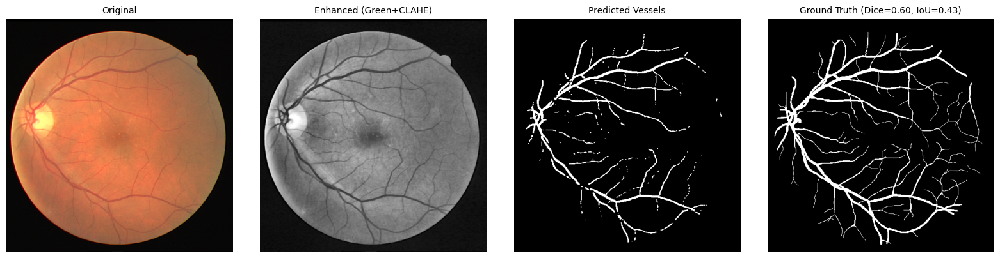

  -> Dice: 0.604, IoU: 0.433
  -> Saved comparison figure: output/result_21.png

Processing 22_training.tif...


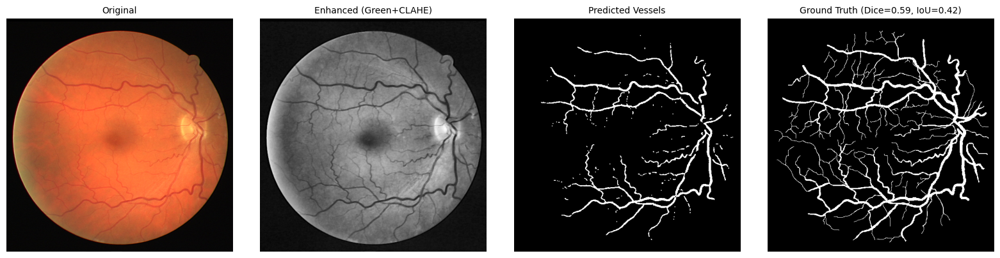

  -> Dice: 0.595, IoU: 0.423
  -> Saved comparison figure: output/result_22.png

Processing 23_training.tif...


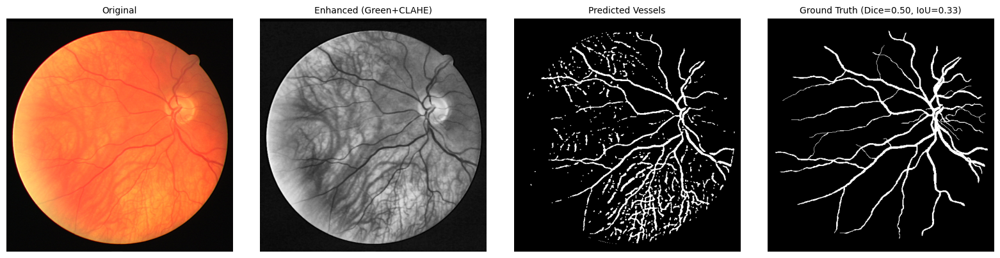

  -> Dice: 0.502, IoU: 0.335
  -> Saved comparison figure: output/result_23.png

Processing 24_training.tif...


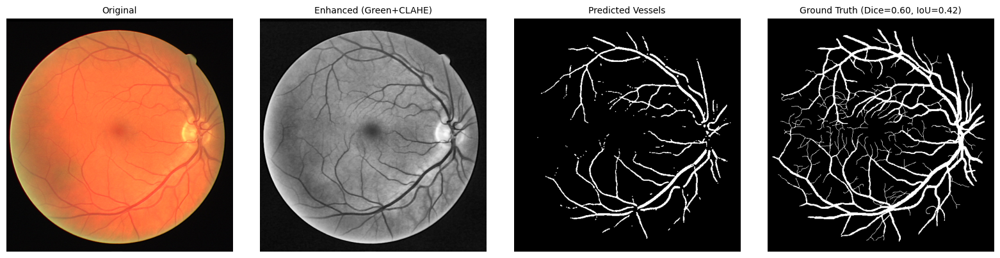

  -> Dice: 0.596, IoU: 0.425
  -> Saved comparison figure: output/result_24.png

Processing 25_training.tif...


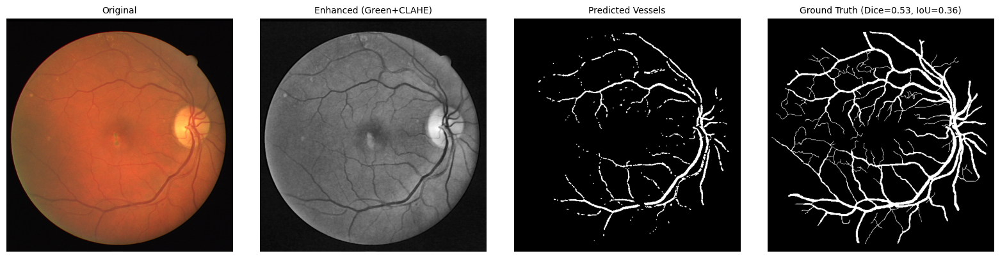

  -> Dice: 0.530, IoU: 0.361
  -> Saved comparison figure: output/result_25.png

Processing 26_training.tif...


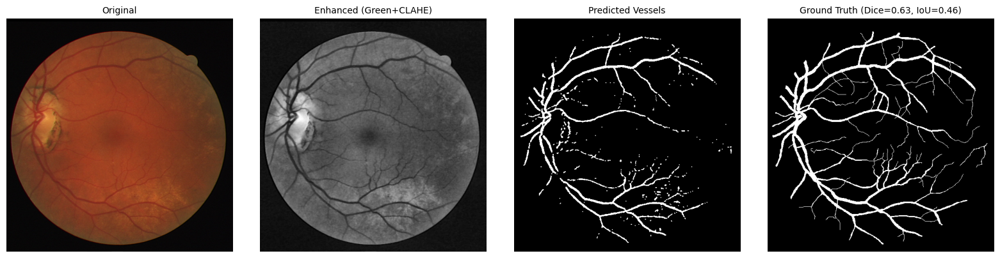

  -> Dice: 0.630, IoU: 0.460
  -> Saved comparison figure: output/result_26.png

Processing 27_training.tif...


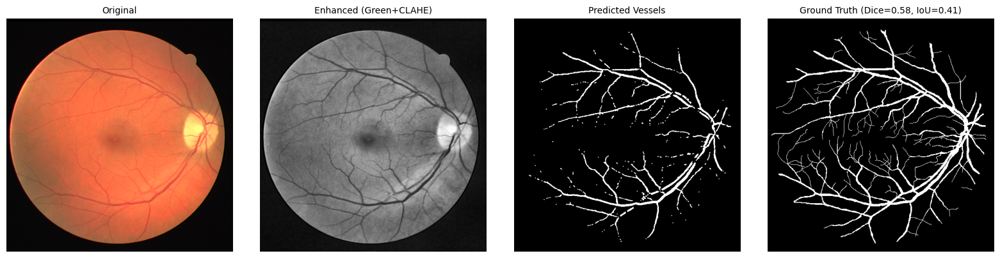

  -> Dice: 0.579, IoU: 0.407
  -> Saved comparison figure: output/result_27.png

Processing 28_training.tif...


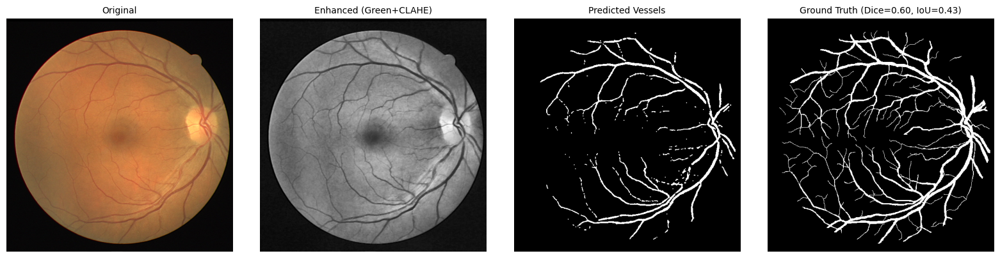

  -> Dice: 0.605, IoU: 0.433
  -> Saved comparison figure: output/result_28.png

Processing 29_training.tif...


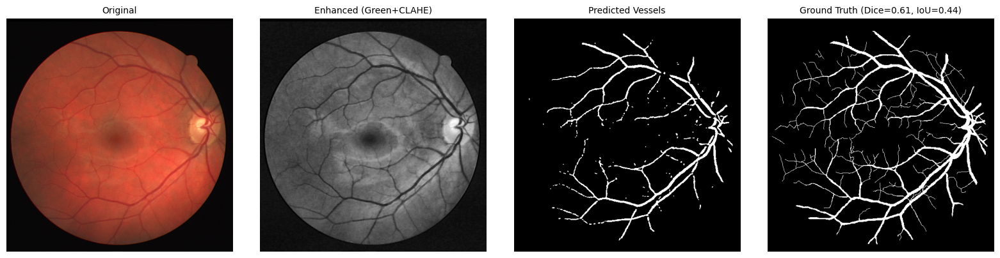

  -> Dice: 0.613, IoU: 0.441
  -> Saved comparison figure: output/result_29.png

Processing 30_training.tif...


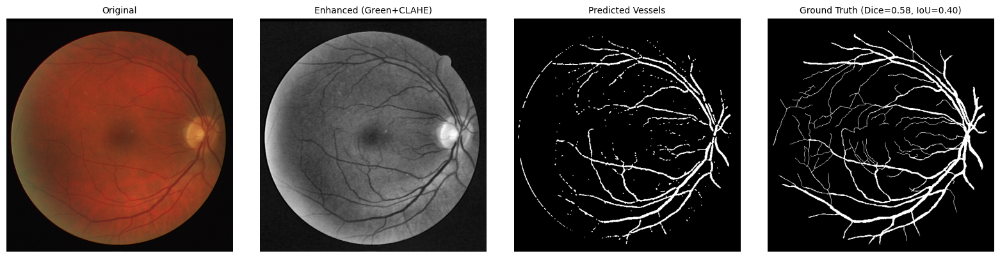

  -> Dice: 0.575, IoU: 0.404
  -> Saved comparison figure: output/result_30.png

Processing 31_training.tif...


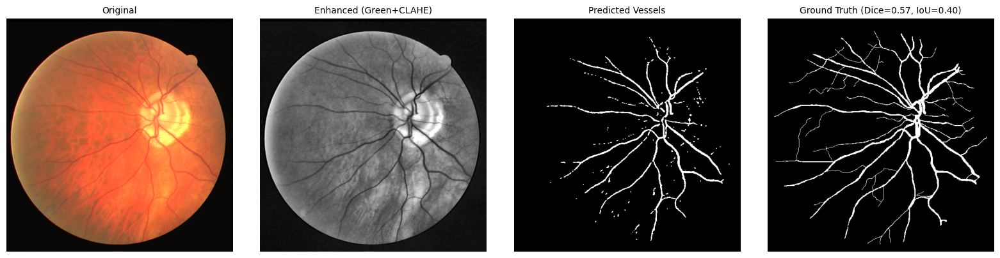

  -> Dice: 0.574, IoU: 0.403
  -> Saved comparison figure: output/result_31.png

Processing 32_training.tif...


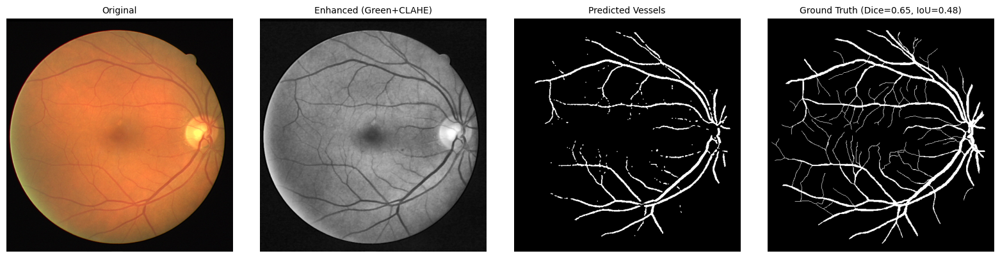

  -> Dice: 0.646, IoU: 0.477
  -> Saved comparison figure: output/result_32.png

Processing 33_training.tif...


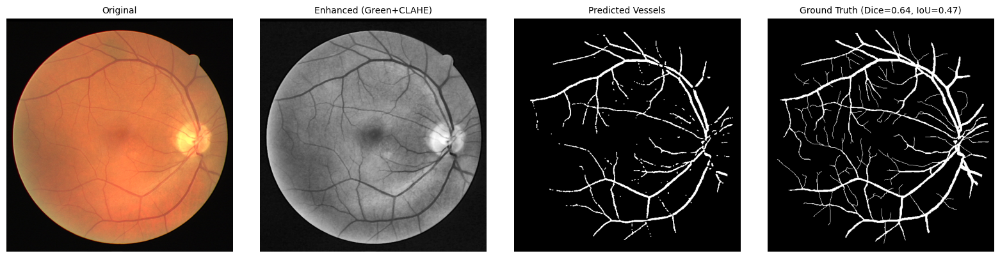

  -> Dice: 0.639, IoU: 0.470
  -> Saved comparison figure: output/result_33.png

Processing 34_training.tif...


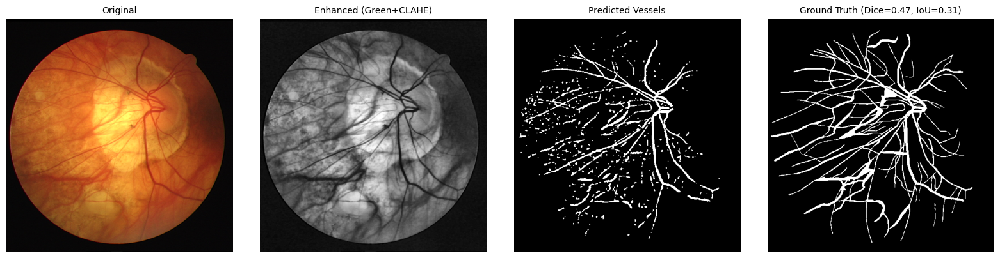

  -> Dice: 0.468, IoU: 0.306
  -> Saved comparison figure: output/result_34.png

Processing 35_training.tif...


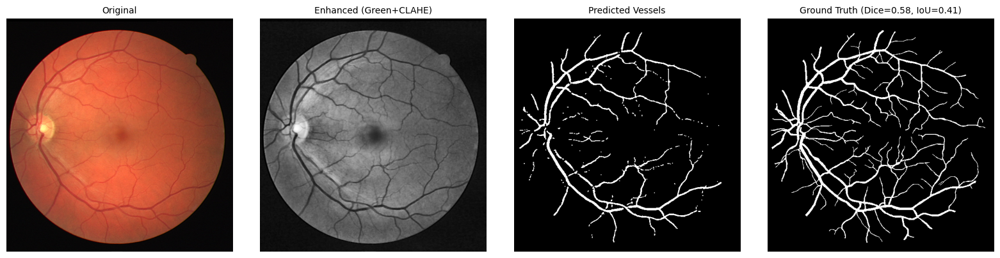

  -> Dice: 0.582, IoU: 0.411
  -> Saved comparison figure: output/result_35.png



In [25]:
images_folder = os.path.join(DATASET_ROOT, SPLIT, IMAGES_SUBDIR)
masks_folder = os.path.join(DATASET_ROOT, SPLIT, MASKS_SUBDIR)
fov_folder = os.path.join(DATASET_ROOT, SPLIT, FOV_SUBDIR)

image_paths = sorted(
    glob.glob(os.path.join(images_folder, "*.tif"))
    + glob.glob(os.path.join(images_folder, "*.png"))
    + glob.glob(os.path.join(images_folder, "*.jpg"))
)[:NUM_IMAGES_TO_USE]

if not image_paths:
    print(f"No images found in '{images_folder}'. "
          f"Check that DATASET_ROOT/SPLIT/IMAGES_SUBDIR are set correctly "
          f"for your unzipped folder structure.")
else:
    print(f"Found {len(image_paths)} image(s) in '{images_folder}'. Processing...\n")
    results = []
    for path in image_paths:
        print(f"Processing {os.path.basename(path)}...")
        res = process_image(path, images_folder, masks_folder, fov_folder)
        if res:
            results.append(res)
            if res["has_ground_truth"]:
                print(f"  -> Dice: {res['dice']:.3f}, IoU: {res['iou']:.3f}")
            else:
                print(f"  -> No ground truth found for this image (segmentation only).")
            print(f"  -> Saved comparison figure: {res['figure']}\n")

## Step 10: Summary table

In [23]:
evaluated = [r for r in results if r["has_ground_truth"]]
if evaluated:
    avg_dice = np.mean([r["dice"] for r in evaluated])
    avg_iou = np.mean([r["iou"] for r in evaluated])
    print("===== SUMMARY =====")
    print(f"{'Image ID':<12}{'Dice':<10}{'IoU':<10}")
    for r in evaluated:
        print(f"{r['image_id']:<12}{r['dice']:<10.3f}{r['iou']:<10.3f}")
    print(f"\nAverage Dice: {avg_dice:.3f}, Average IoU: {avg_iou:.3f}")
else:
    print("No ground-truth masks were found, so Dice/IoU could not be computed. "
          "Make sure MASKS_SUBDIR points to the '1st_manual' folder (only "
          "available for the 'training' split).")

print(f"\nAll result figures saved in '{OUTPUT_FOLDER}/'.")

===== SUMMARY =====
Image ID    Dice      IoU       
21          0.604     0.433     
22          0.595     0.423     
23          0.502     0.335     
24          0.596     0.425     
25          0.530     0.361     
26          0.630     0.460     
27          0.579     0.407     
28          0.605     0.433     
29          0.613     0.441     
30          0.575     0.404     
31          0.574     0.403     
32          0.646     0.477     
33          0.639     0.470     
34          0.468     0.306     
35          0.582     0.411     

Average Dice: 0.583, Average IoU: 0.413

All result figures saved in 'output/'.


## Step 11: Compare Black-hat+Otsu vs Adaptive Thresholding

ID    Dice(Otsu)    Dice(Adaptive)  IoU(Otsu)   IoU(Adaptive) 
21    0.604         0.376           0.433       0.232         
22    0.595         0.409           0.423       0.257         
23    0.502         0.288           0.335       0.168         
24    0.596         0.481           0.425       0.316         
25    0.530         0.408           0.361       0.256         
26    0.630         0.398           0.460       0.249         
27    0.579         0.396           0.407       0.247         
28    0.605         0.425           0.433       0.269         
29    0.613         0.400           0.441       0.250         
30    0.575         0.380           0.404       0.234         
31    0.574         0.311           0.403       0.184         
32    0.646         0.413           0.477       0.260         
33    0.639         0.393           0.470       0.245         
34    0.468         0.376           0.306       0.232         
35    0.582         0.393           0.411       0.244  

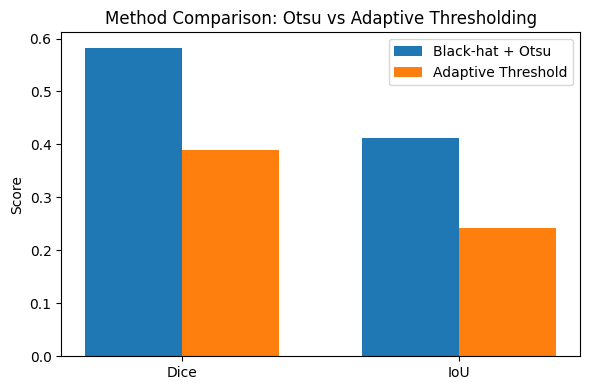

In [26]:

#  Compare Black-hat+Otsu vs Adaptive Thresholding
comparison_results = []

for path in image_paths:
    filename = os.path.basename(path)
    image_id = filename.split("_")[0]

    original = cv2.imread(path)
    green, enhanced = preprocess_and_restore(original)

    gt_path = find_matching_file(masks_folder, image_id, ["_manual1.gif"])
    fov_path = find_matching_file(fov_folder, image_id, ["_training_mask.gif", "_test_mask.gif"])
    ground_truth = load_gif_as_mask(gt_path) if gt_path else None
    fov_mask = load_gif_as_mask(fov_path) if fov_path else None

    if ground_truth is None:
        continue

    # Method A: your original black-hat + Otsu
    pred_otsu = segment_vessels(enhanced, fov_mask=fov_mask)
    dice_otsu, iou_otsu = dice_and_iou(pred_otsu, ground_truth, fov_mask=fov_mask)

    # Method B: adaptive thresholding
    pred_adaptive = segment_vessels_adaptive(enhanced, fov_mask=fov_mask)
    dice_adaptive, iou_adaptive = dice_and_iou(pred_adaptive, ground_truth, fov_mask=fov_mask)

    comparison_results.append({
        "image_id": image_id,
        "dice_otsu": dice_otsu, "iou_otsu": iou_otsu,
        "dice_adaptive": dice_adaptive, "iou_adaptive": iou_adaptive,
    })

# Print comparison table
print(f"{'ID':<6}{'Dice(Otsu)':<14}{'Dice(Adaptive)':<16}{'IoU(Otsu)':<12}{'IoU(Adaptive)':<14}")
for r in comparison_results:
    print(f"{r['image_id']:<6}{r['dice_otsu']:<14.3f}{r['dice_adaptive']:<16.3f}"
          f"{r['iou_otsu']:<12.3f}{r['iou_adaptive']:<14.3f}")

avg_dice_otsu = np.mean([r["dice_otsu"] for r in comparison_results])
avg_dice_adaptive = np.mean([r["dice_adaptive"] for r in comparison_results])
avg_iou_otsu = np.mean([r["iou_otsu"] for r in comparison_results])
avg_iou_adaptive = np.mean([r["iou_adaptive"] for r in comparison_results])

print(f"\nAverage Dice - Otsu: {avg_dice_otsu:.3f} | Adaptive: {avg_dice_adaptive:.3f}")
print(f"Average IoU  - Otsu: {avg_iou_otsu:.3f} | Adaptive: {avg_iou_adaptive:.3f}")

# Bar chart comparing the two methods - good for your Report's Results section
labels = ["Dice", "IoU"]
otsu_scores = [avg_dice_otsu, avg_iou_otsu]
adaptive_scores = [avg_dice_adaptive, avg_iou_adaptive]

x = np.arange(len(labels))
width = 0.35
fig, ax = plt.subplots(figsize=(6, 4))
ax.bar(x - width/2, otsu_scores, width, label="Black-hat + Otsu")
ax.bar(x + width/2, adaptive_scores, width, label="Adaptive Threshold")
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_ylabel("Score")
ax.set_title("Method Comparison: Otsu vs Adaptive Thresholding")
ax.legend()
plt.tight_layout()
plt.savefig("output/method_comparison.png", dpi=150)
plt.show()

## Step 12: Best vs Worst case comparison (using Otsu results)

Best case:  Image 32  (Dice=0.646, IoU=0.477)
Worst case: Image 34  (Dice=0.468, IoU=0.306)


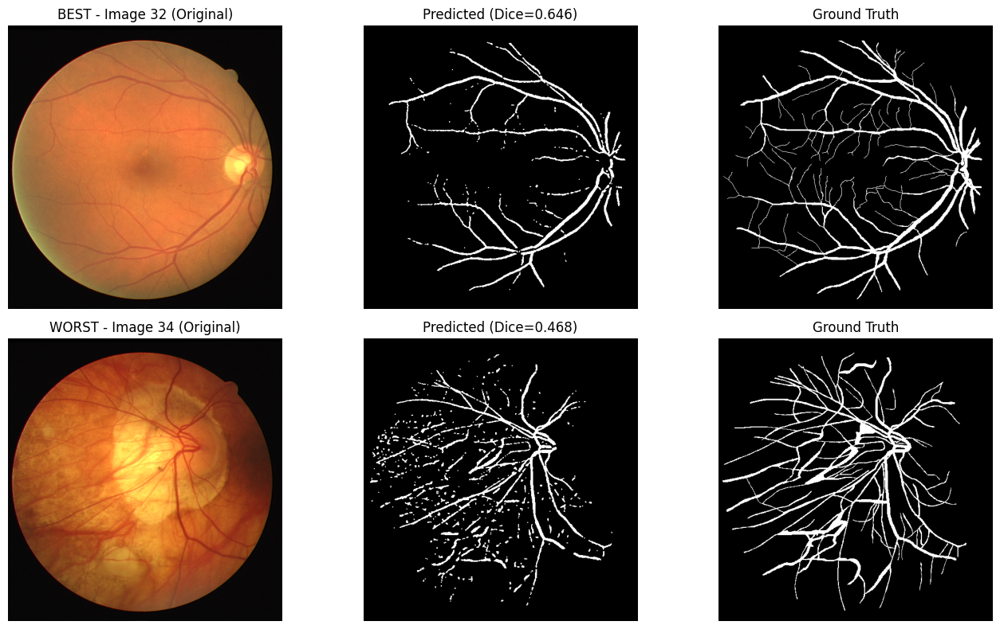

In [27]:

# Best vs Worst case comparison (using Otsu results)

best = max(results, key=lambda r: r["dice"] if r["has_ground_truth"] else -1)
worst = min(
    (r for r in results if r["has_ground_truth"]),
    key=lambda r: r["dice"]
)

print(f"Best case:  Image {best['image_id']}  (Dice={best['dice']:.3f}, IoU={best['iou']:.3f})")
print(f"Worst case: Image {worst['image_id']}  (Dice={worst['dice']:.3f}, IoU={worst['iou']:.3f})")

# Re-run the pipeline on just these two images to get their arrays for display
def get_pipeline_arrays(image_id):
    path = os.path.join(images_folder, f"{image_id}_training.tif")
    original = cv2.imread(path)
    green, enhanced = preprocess_and_restore(original)
    gt_path = find_matching_file(masks_folder, image_id, ["_manual1.gif"])
    fov_path = find_matching_file(fov_folder, image_id, ["_training_mask.gif", "_test_mask.gif"])
    ground_truth = load_gif_as_mask(gt_path) if gt_path else None
    fov_mask = load_gif_as_mask(fov_path) if fov_path else None
    predicted = segment_vessels(enhanced, fov_mask=fov_mask)
    return original, predicted, ground_truth

best_orig, best_pred, best_gt = get_pipeline_arrays(best["image_id"])
worst_orig, worst_pred, worst_gt = get_pipeline_arrays(worst["image_id"])

fig, axes = plt.subplots(2, 3, figsize=(14, 8))

axes[0, 0].imshow(cv2.cvtColor(best_orig, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title(f"BEST - Image {best['image_id']} (Original)")
axes[0, 1].imshow(best_pred, cmap="gray")
axes[0, 1].set_title(f"Predicted (Dice={best['dice']:.3f})")
axes[0, 2].imshow(best_gt, cmap="gray")
axes[0, 2].set_title("Ground Truth")

axes[1, 0].imshow(cv2.cvtColor(worst_orig, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title(f"WORST - Image {worst['image_id']} (Original)")
axes[1, 1].imshow(worst_pred, cmap="gray")
axes[1, 1].set_title(f"Predicted (Dice={worst['dice']:.3f})")
axes[1, 2].imshow(worst_gt, cmap="gray")
axes[1, 2].set_title("Ground Truth")

for ax in axes.flat:
    ax.axis("off")

plt.tight_layout()
plt.savefig("output/best_vs_worst.png", dpi=150)
plt.show()

## **Interpretation: Best vs Worst Case, and Otsu vs Adaptive Thresholding**

**Otsu vs Adaptive Thresholding:** Otsu's global thresholding (avg. Dice = 0.583)
consistently outperformed adaptive thresholding (avg. Dice = 0.390) across all 15
images. This suggests adaptive thresholding's local blockSize window was picking up
background texture and illumination variation as false vessel pixels, increasing
false positives and lowering both Dice and IoU.

**Best case (Image 32, Dice=0.646):** The retina background is relatively uniform
in brightness and color, giving clear contrast between vessels and background. The
predicted mask captures the main vessel branches well, though it misses some of the
thinnest peripheral vessels visible in the ground truth.

**Worst case (Image 34, Dice=0.468):** This image contains a large bright glare/
reflection artifact on the left side, along with uneven illumination overall. The
predicted mask shows scattered false-positive speckles concentrated exactly in that
bright region, where the black-hat filter mistook lighting artifacts for vessel-like
dark structures. Meanwhile the actual thin vessels in this image (visible in the
ground truth) were partially missed due to lower contrast.

This comparison highlights a key limitation of classical thresholding-based
segmentation: it performs well on images with uniform illumination and good
vessel-background contrast, but is sensitive to lighting artifacts and uneven
brightness, producing false positives in bright regions and missed detections
in low-contrast regions.